In [21]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.utils import image_dataset_from_directory

In [ ]:
# Defining the path to the dataset
dataset_path = os.path.join("..", "initial_test_data")

# Loading the image dataset as grayscale directly
raw_dataset = image_dataset_from_directory(
    dataset_path,
    labels=None,                        # Test dataset is not labeled
    #label_mode='int',                  # Not needed yet
    #class_names=None,                  # Not needed yet
    color_mode='grayscale',             # Importing images in grayscale as first conversion step
    batch_size=None,                    # Batches not needed yet
    #image_size=(256, 256),
    shuffle=False,
    #seed=None,
    #validation_split=None,
    #subset=None,
    interpolation='mitchellcubic',
    follow_links=False,
    crop_to_aspect_ratio=False,         # Could be helpful when merging different datasets
    )

Found 100 files belonging to 1 classes.


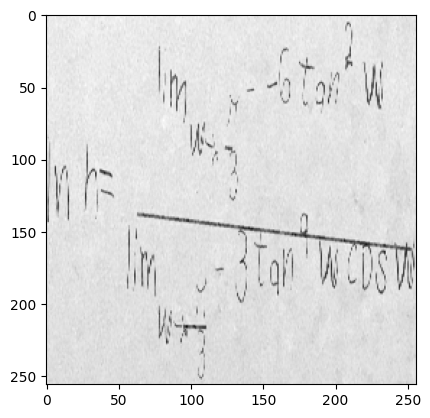

In [ ]:
plt.imshow(list(raw_dataset)[0], cmap='gray')

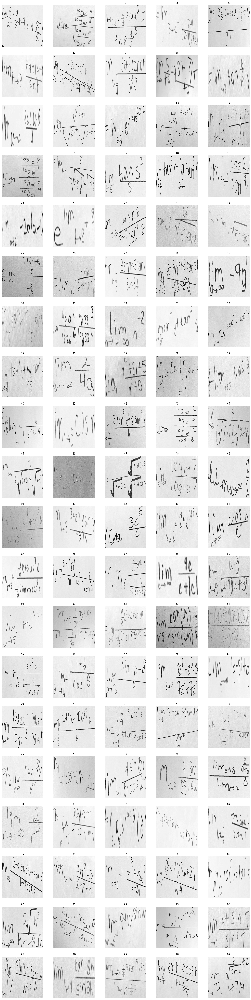

In [ ]:
plt.figure(figsize=(20, 80))
for i in range(100):
    ax = plt.subplot(20, 5, i + 1)
    plt.imshow(list(raw_dataset)[i], cmap='gray')
    plt.title(i)
    plt.axis("off")


In [ ]:
tricky_images = [4, 6, 11, 14, 16, 23, 30, 38, 46, 50, 61, 64, 74, 76, 93]

interpolation_methods = ["bilinear", "nearest", "bicubic", "area", "lanczos3", "lanczos5", "gaussian", "mitchellcubic"]

In [ ]:
dataset_list = [image_dataset_from_directory(
        dataset_path,
        labels=None,                        # Test dataset is not labeled
        #label_mode='int',                  # Not needed yet
        #class_names=None,                  # Not needed yet
        color_mode='grayscale',             # Importing images in grayscale as first conversion step
        batch_size=None,                    # Batches not needed yet
        #image_size=(256, 256),
        shuffle=False,
        #seed=None,
        #validation_split=None,
        #subset=None,
        interpolation=method,
        follow_links=False,
        crop_to_aspect_ratio=False,         # Could be helpful when merging different datasets
        )
        for method in interpolation_methods]


Found 100 files belonging to 1 classes.
Found 100 files belonging to 1 classes.
Found 100 files belonging to 1 classes.
Found 100 files belonging to 1 classes.
Found 100 files belonging to 1 classes.
Found 100 files belonging to 1 classes.
Found 100 files belonging to 1 classes.
Found 100 files belonging to 1 classes.


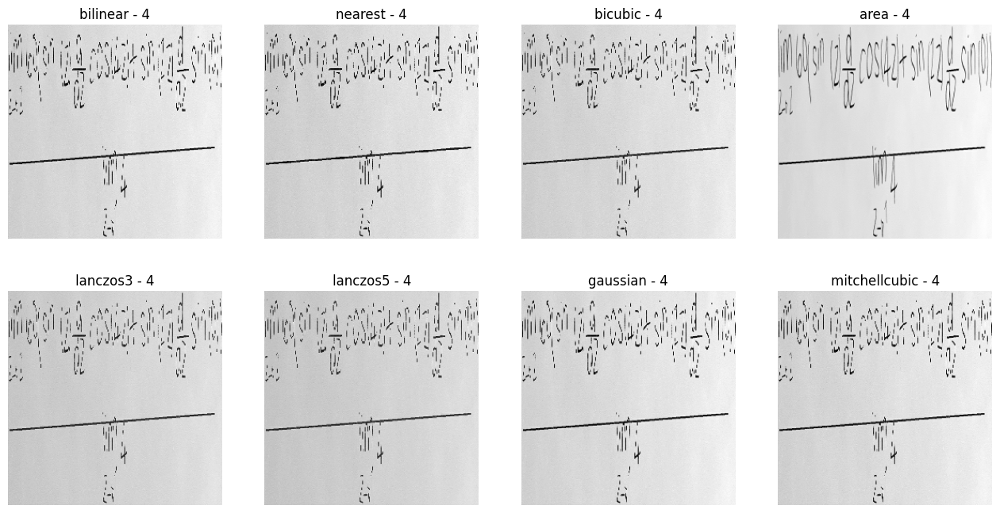

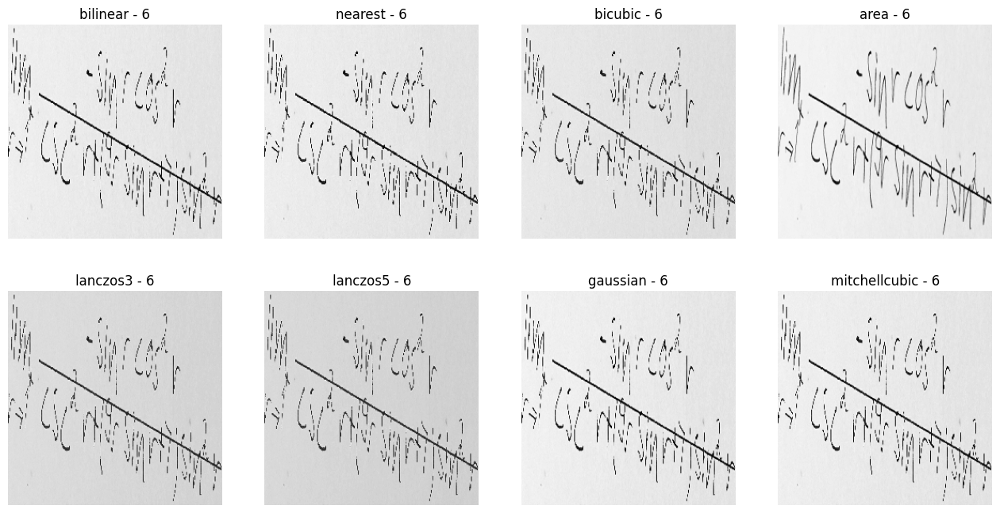

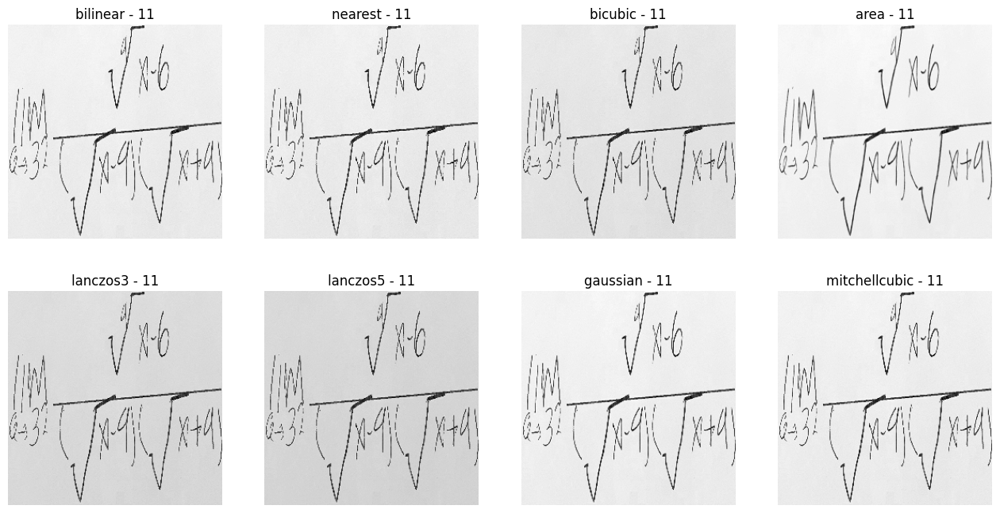

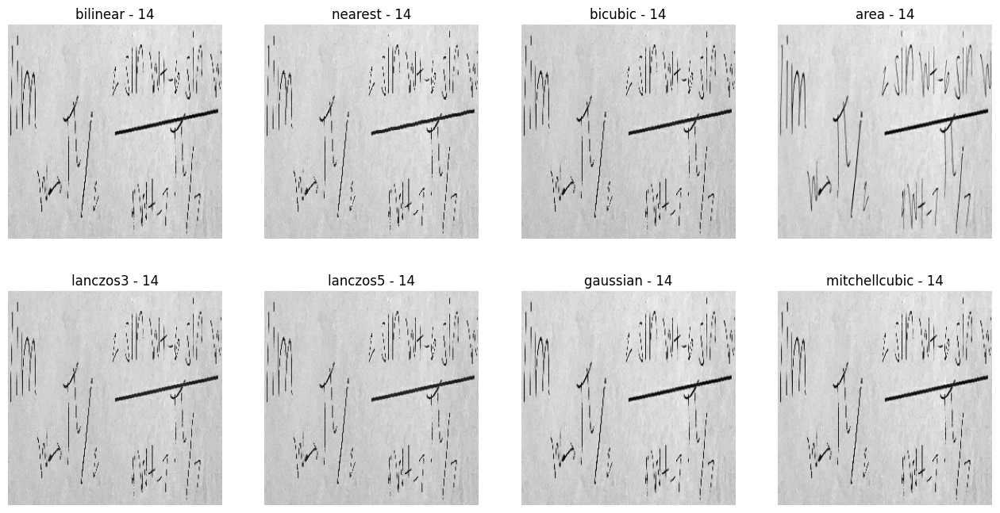

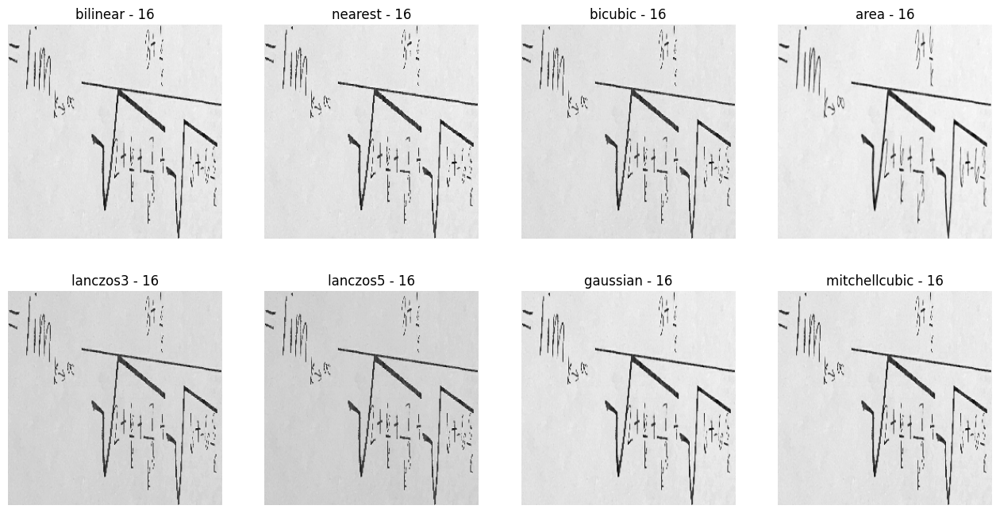

...

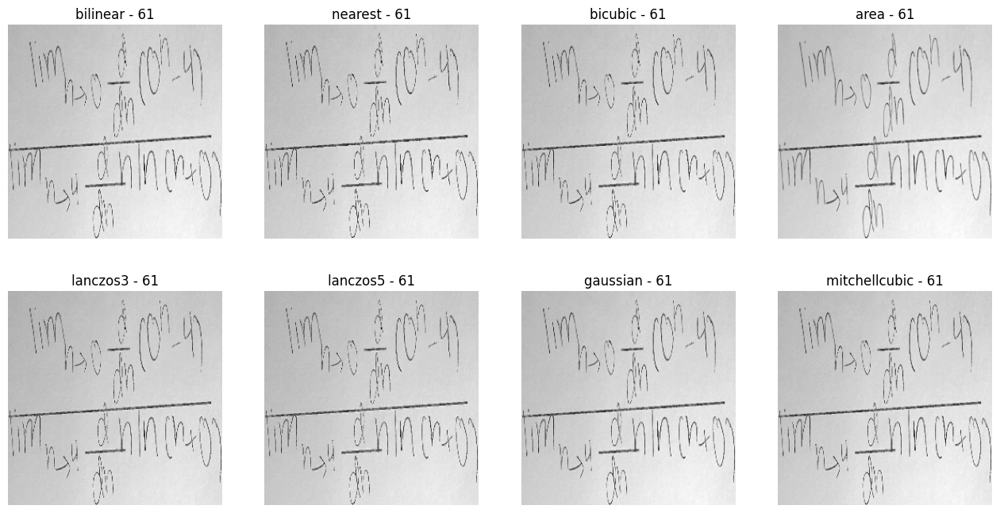

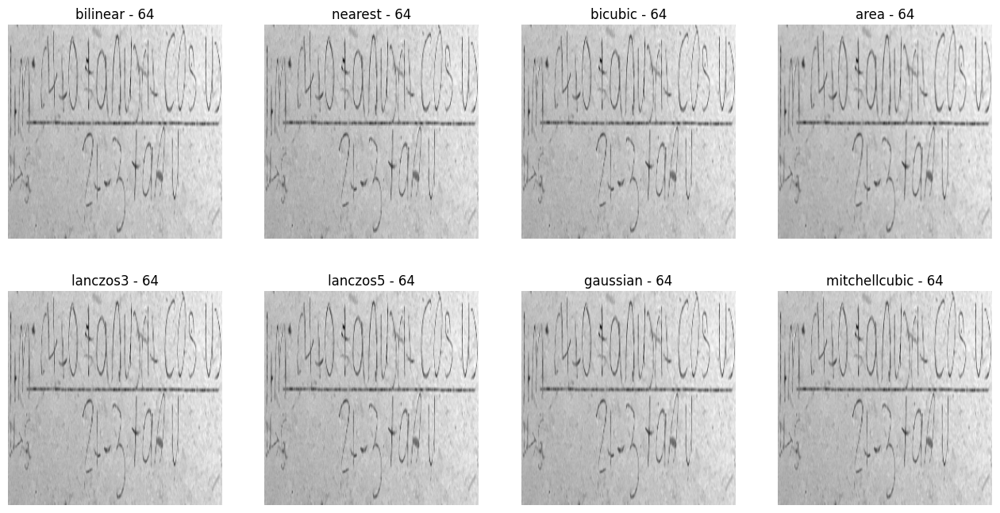

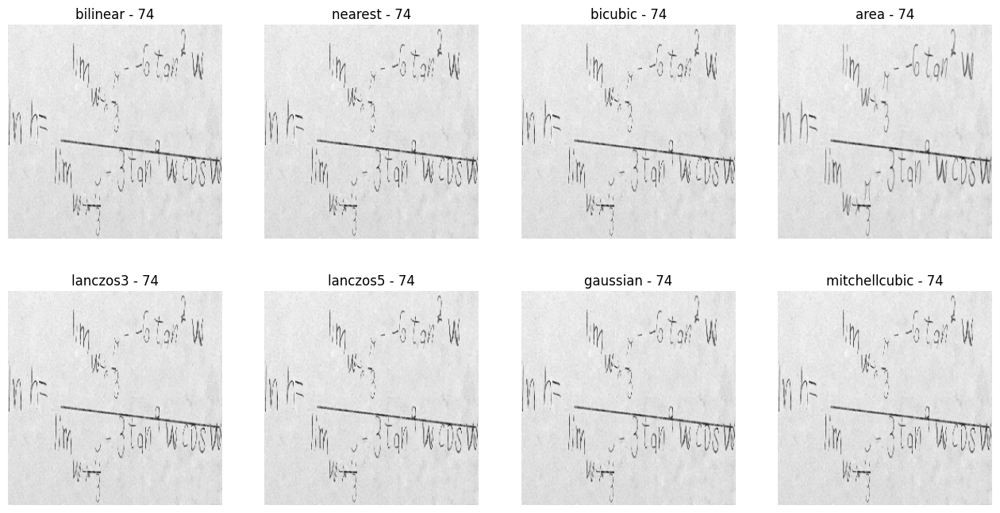

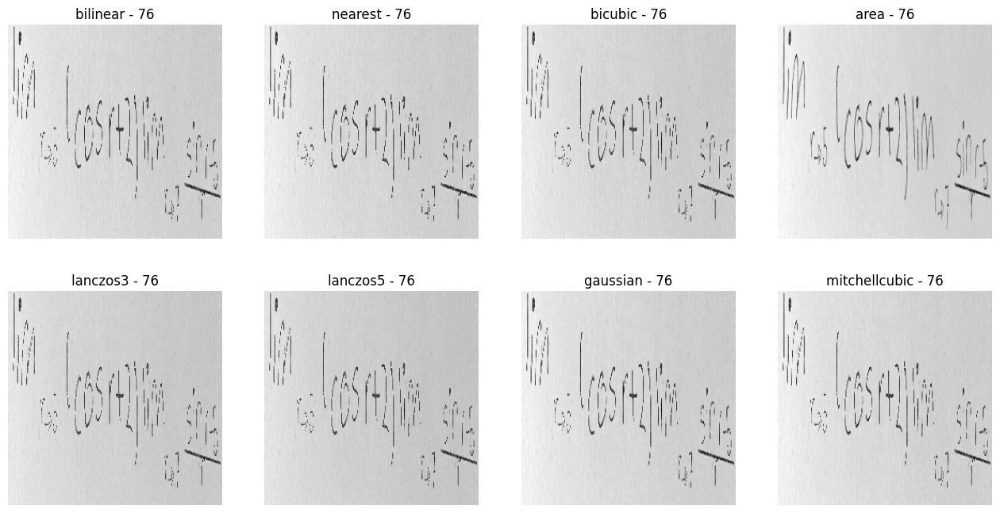

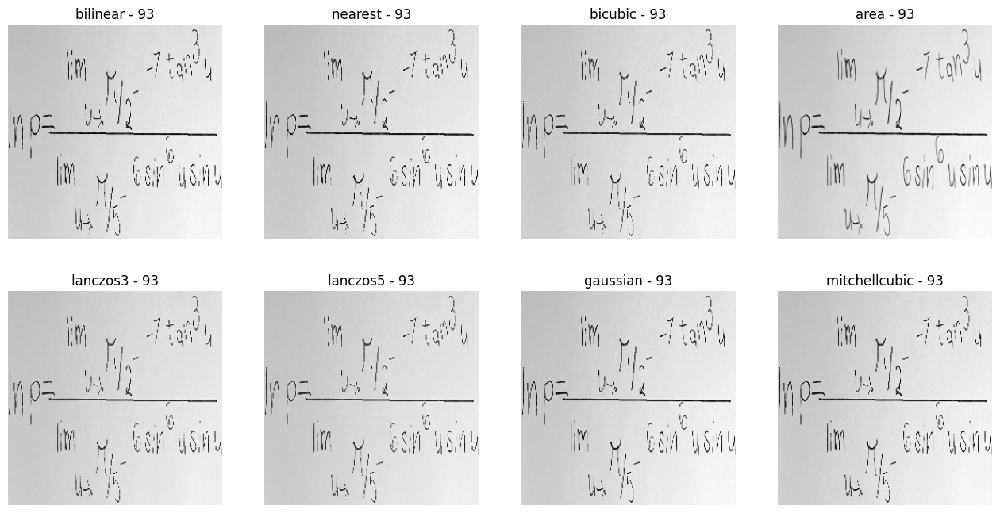

In [ ]:

for img in tricky_images:
    plt.figure(figsize=(16, 8))
    pos = 0
    for dataset in dataset_list:
        ax = plt.subplot(2, 4, pos+1)
        plt.imshow(list(dataset)[img], cmap='gray')
        plt.title(f'{interpolation_methods[pos]} - {img}')
        plt.axis("off")
        pos = pos + 1
    plt.show()

In [2]:
!pip install -q --upgrade keras-cv
!pip install -q --upgrade keras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 613.1/613.1 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 37.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 8.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.0 requires keras<2.16,>=2.15.0, but you have keras 3.0.5 which is incompatible.


In [32]:
import keras_cv.layers
from keras.utils import load_img

In [19]:
import numpy as np

In [9]:
%cd /content/drive/MyDrive/Colab Notebooks/initial_test_data

/content/drive/MyDrive/Colab Notebooks/initial_test_data


In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


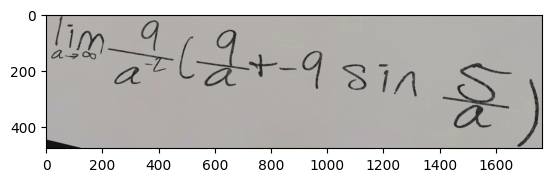

In [22]:
image = load_img("/content/drive/MyDrive/Colab Notebooks/initial_test_data/batch_1_salmple100/000f3f60-c994-4df4-81ca-0c10e3feb67c.jpg")
image = np.array(image)

plt.imshow(image)

In [23]:
image.shape

(475, 1765, 3)

(475, 1765, 1)


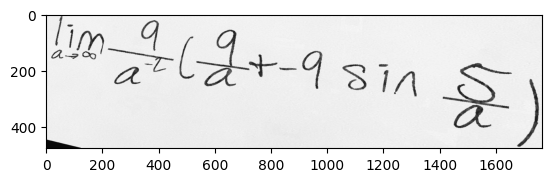

In [30]:
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

gray_image = rgb2gray(image)

gray_image = np.expand_dims(gray_image, axis=-1)

print(gray_image.shape)
plt.imshow(gray_image, cmap='gray')

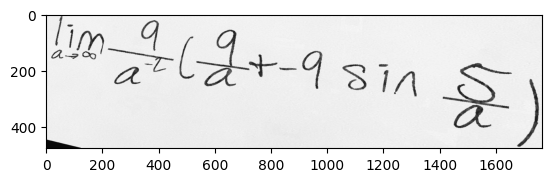

In [40]:
image = load_img("/content/drive/MyDrive/Colab Notebooks/initial_test_data/batch_1_salmple100/000f3f60-c994-4df4-81ca-0c10e3feb67c.jpg")
to_grayscale = keras_cv.layers.Grayscale(output_channels=1)

gray_image = to_grayscale(image)

plt.imshow(gray_image, cmap='gray')

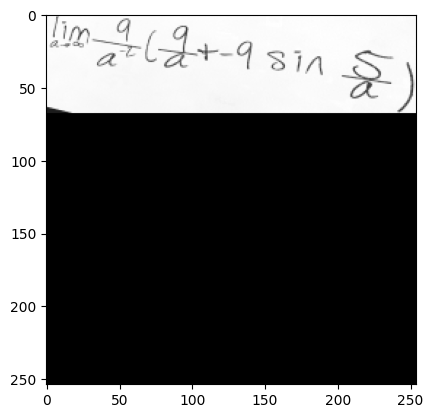

In [42]:
resize_img = keras_cv.layers.Resizing(
    254,
    254,
    interpolation="area",
    crop_to_aspect_ratio=False,
    pad_to_aspect_ratio=True,
    bounding_box_format="xywh",
)

resized_img = resize_img(gray_image)
plt.imshow(resized_img, cmap='gray')

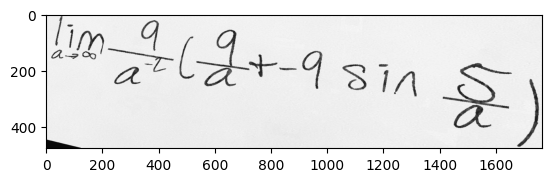

In [59]:
autocontrast = keras_cv.layers.AutoContrast([0, 255])

highContrast_img = autocontrast(gray_image)
plt.imshow(highContrast_img, cmap='gray')

# Testing Scikit-Image

In [1]:
import skimage as ski